In [10]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/2014_world_gdp_with_codes.csv/2014_world_gdp_with_codes.csv
/kaggle/input/covid19-in-india/IndividualDetails.csv
/kaggle/input/covid19-in-india/ICMRTestingLabs.csv
/kaggle/input/covid19-in-india/population_india_census2011.csv
/kaggle/input/covid19-in-india/AgeGroupDetails.csv
/kaggle/input/covid19-in-india/StatewiseTestingDetails.csv
/kaggle/input/covid19-in-india/HospitalBedsIndia.csv
/kaggle/input/covid19-in-india/covid_19_india.csv
/kaggle/input/corona-virus-report/usa_county_wise.csv
/kaggle/input/corona-virus-report/worldometer_data.csv
/kaggle/input/corona-virus-report/covid_19_clean_complete.csv
/kaggle/input/corona-virus-report/day_wise.csv
/kaggle/input/corona-virus-report/country_wise_latest.csv
/kaggle/input/corona-virus-report/full_grouped.csv


In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.integrate import odeint

from plotly.offline import iplot, init_notebook_mode
import math
import bokeh 
import matplotlib.pyplot as plt
import plotly.express as px
from urllib.request import urlopen
import json
from dateutil import parser
from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file
from bokeh.layouts import row, column
from bokeh.resources import INLINE
from bokeh.io import output_notebook
from bokeh.models import Span
import warnings
warnings.filterwarnings("ignore")
output_notebook(resources=INLINE)

Loading BokehJS ...

In [26]:
covid=pd.read_csv('/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv')
covid.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [27]:
#Extracting India's data 
covid_india=covid[covid['Country/Region']=="India"]

#Extracting other countries for comparison of worst affected countries
covid_spain=covid[covid['Country/Region']=="Spain"]
covid_us=covid[covid['Country/Region']=="US"]
covid_italy=covid[covid['Country/Region']=="Italy"]
covid_iran=covid[covid['Country/Region']=="Iran"]
covid_france=covid[covid['Country/Region']=="France"]
covid_uk=covid[covid['Country/Region']=="UK"]

#Extracting data of neighbouring countries
covid_pak=covid[covid['Country/Region']=="Pakistan"]
covid_china=covid[covid['Country/Region']=="Mainland China"]
covid_afg=covid[covid['Country/Region']=="Afghanistan"]
covid_nepal=covid[covid['Country/Region']=="Nepal"]
covid_bhutan=covid[covid['Country/Region']=="Bhutan"]
covid_lanka=covid[covid["Country/Region"]=="Sri Lanka"]
covid_ban=covid[covid["Country/Region"]=="Bangladesh"]

In [28]:
#Converting the date into Datetime format
covid_india["ObservationDate"]=pd.to_datetime(covid_india["ObservationDate"])
covid_spain["ObservationDate"]=pd.to_datetime(covid_spain["ObservationDate"])
covid_us["ObservationDate"]=pd.to_datetime(covid_us["ObservationDate"])
covid_italy["ObservationDate"]=pd.to_datetime(covid_italy["ObservationDate"])
covid_iran["ObservationDate"]=pd.to_datetime(covid_iran["ObservationDate"])
covid_france["ObservationDate"]=pd.to_datetime(covid_france["ObservationDate"])
covid_uk["ObservationDate"]=pd.to_datetime(covid_uk["ObservationDate"])

covid_pak["ObservationDate"]=pd.to_datetime(covid_pak["ObservationDate"])
covid_china["ObservationDate"]=pd.to_datetime(covid_china["ObservationDate"])
covid_afg["ObservationDate"]=pd.to_datetime(covid_afg["ObservationDate"])
covid_nepal["ObservationDate"]=pd.to_datetime(covid_nepal["ObservationDate"])
covid_bhutan["ObservationDate"]=pd.to_datetime(covid_bhutan["ObservationDate"])
covid_lanka["ObservationDate"]=pd.to_datetime(covid_lanka["ObservationDate"])
covid_ban["ObservationDate"]=pd.to_datetime(covid_ban["ObservationDate"])

In [29]:
#Grouping the data based on the Date 
india_datewise=covid_india.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
spain_datewise=covid_spain.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
us_datewise=covid_us.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
italy_datewise=covid_italy.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
iran_datewise=covid_iran.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
france_datewise=covid_france.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
uk_datewise=covid_uk.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})

pak_datewise=covid_pak.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
china_datewise=covid_china.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
afg_datewise=covid_afg.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
nepal_datewise=covid_nepal.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
bhutan_datewise=covid_bhutan.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
lanka_datewise=covid_lanka.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
ban_datewise=covid_ban.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})

In [30]:
#Adding week column to perfom weekly analysis further ahead
india_datewise["WeekofYear"]=india_datewise.index.weekofyear
spain_datewise["WeekofYear"]=spain_datewise.index.weekofyear
us_datewise["WeekofYear"]=us_datewise.index.weekofyear
italy_datewise["WeekofYear"]=italy_datewise.index.weekofyear
iran_datewise["WeekofYear"]=iran_datewise.index.weekofyear
france_datewise["WeekofYear"]=france_datewise.index.weekofyear
uk_datewise["WeekofYear"]=uk_datewise.index.weekofyear

pak_datewise["WeekofYear"]=pak_datewise.index.weekofyear
china_datewise["WeekofYear"]=china_datewise.index.weekofyear
afg_datewise["WeekofYear"]=afg_datewise.index.weekofyear
nepal_datewise["WeekofYear"]=nepal_datewise.index.weekofyear
bhutan_datewise["WeekofYear"]=bhutan_datewise.index.weekofyear
lanka_datewise["WeekofYear"]=lanka_datewise.index.weekofyear
ban_datewise["WeekofYear"]=ban_datewise.index.weekofyear

In [31]:
india_datewise["Days Since"]=(india_datewise.index-india_datewise.index[0])
india_datewise["Days Since"]=india_datewise["Days Since"].dt.days

In [32]:
grouped_country=covid.groupby(["Country/Region","ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})

In [33]:
grouped_country["Active Cases"]=grouped_country["Confirmed"]-grouped_country["Recovered"]-grouped_country["Deaths"]
grouped_country["log_confirmed"]=np.log(grouped_country["Confirmed"])
grouped_country["log_active"]=np.log(grouped_country["Active Cases"])

In [34]:
print("Number of Confirmed Cases",india_datewise["Confirmed"].iloc[-1])
print("Number of Recovered Cases",india_datewise["Recovered"].iloc[-1])
print("Number of Death Cases",india_datewise["Deaths"].iloc[-1])
print("Number of Active Cases",india_datewise["Confirmed"].iloc[-1]-india_datewise["Recovered"].iloc[-1]-india_datewise["Deaths"].iloc[-1])
print("Number of Closed Cases",india_datewise["Recovered"].iloc[-1]+india_datewise["Deaths"].iloc[-1])
print("Approximate Number of Confirmed Cases per day",round(india_datewise["Confirmed"].iloc[-1]/india_datewise.shape[0]))
print("Approximate Number of Recovered Cases per day",round(india_datewise["Recovered"].iloc[-1]/india_datewise.shape[0]))
print("Approximate Number of Death Cases per day",round(india_datewise["Deaths"].iloc[-1]/india_datewise.shape[0]))
print("Number of New Cofirmed Cases in last 24 hours are",india_datewise["Confirmed"].iloc[-1]-india_datewise["Confirmed"].iloc[-2])
print("Number of New Recoverd Cases in last 24 hours are",india_datewise["Recovered"].iloc[-1]-india_datewise["Recovered"].iloc[-2])
print("Number of New Death Cases in last 24 hours are",india_datewise["Deaths"].iloc[-1]-india_datewise["Deaths"].iloc[-2])

Number of Confirmed Cases 1155338.0
Number of Recovered Cases 724578.0
Number of Death Cases 28082.0
Number of Active Cases 402678.0
Number of Closed Cases 752660.0
Approximate Number of Confirmed Cases per day 6678.0
Approximate Number of Recovered Cases per day 4188.0
Approximate Number of Death Cases per day 162.0
Number of New Cofirmed Cases in last 24 hours are 37132.0
Number of New Recoverd Cases in last 24 hours are 24491.0
Number of New Death Cases in last 24 hours are 585.0


Text(0.5, 1.0, 'Distribution of Number of Active Cases in India over Date')

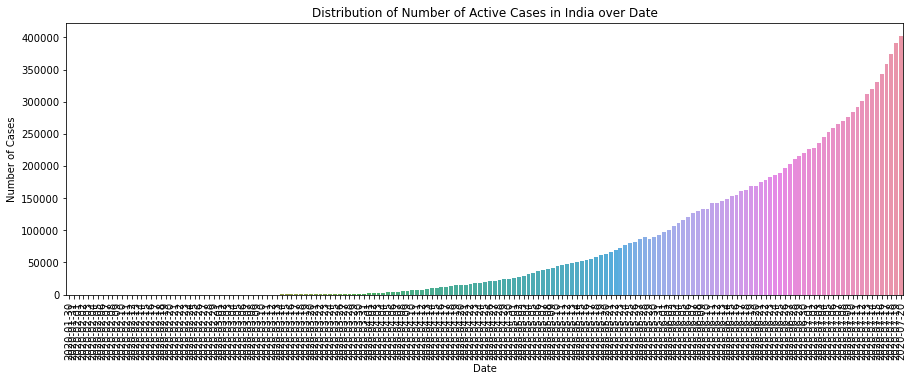

In [35]:
plt.figure(figsize=(15,5))
sns.barplot(x=india_datewise.index.date,y=india_datewise["Confirmed"]-india_datewise["Recovered"]-india_datewise["Deaths"])
plt.xticks(rotation=90)
plt.ylabel("Number of Cases")
plt.xlabel("Date")
plt.title("Distribution of Number of Active Cases in India over Date")

Text(0.5, 1.0, 'Distribution of Number of Closed Cases in India over Date')

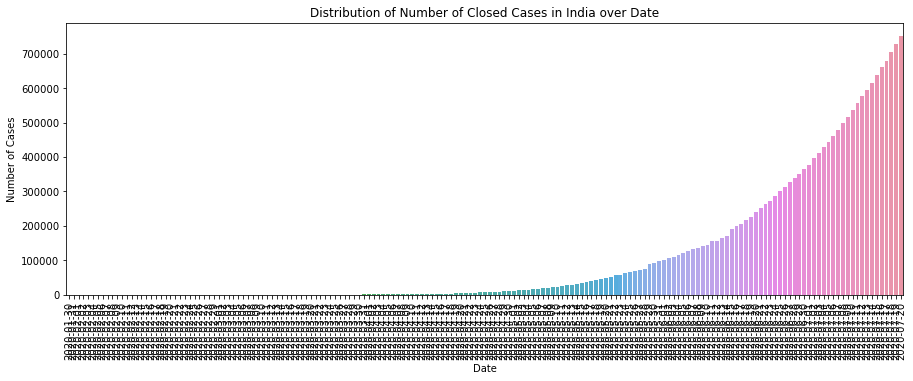

In [36]:
plt.figure(figsize=(15,5))
sns.barplot(x=india_datewise.index.date,y=india_datewise["Recovered"]+india_datewise["Deaths"])
plt.xticks(rotation=90)
plt.ylabel("Number of Cases")
plt.xlabel("Date")
plt.title("Distribution of Number of Closed Cases in India over Date")

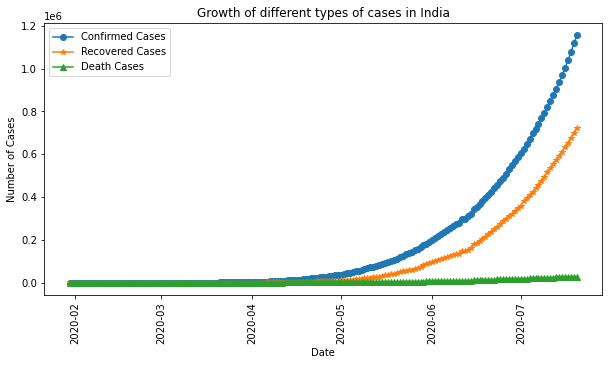

In [37]:
plt.figure(figsize=(10,5))
plt.plot(india_datewise["Confirmed"],label="Confirmed Cases",marker='o')
plt.plot(india_datewise["Recovered"],label="Recovered Cases",marker='*')
plt.plot(india_datewise["Deaths"],label="Death Cases",marker="^")
plt.xticks(rotation=90)
plt.ylabel("Number of Cases")
plt.xlabel("Date")
plt.title("Growth of different types of cases in India")
plt.legend()

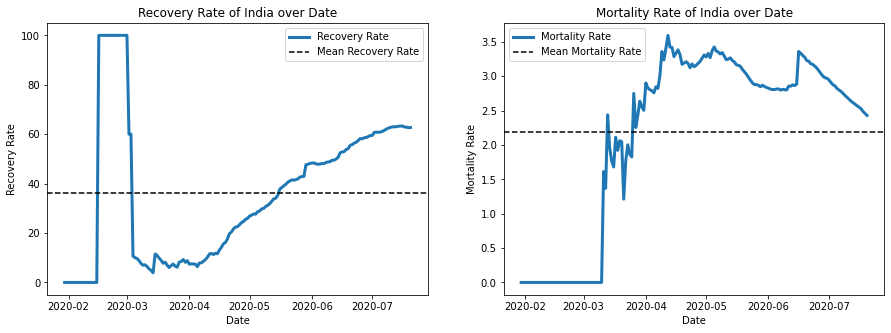

In [38]:
fig, (ax1,ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.plot((india_datewise["Recovered"]/india_datewise["Confirmed"])*100,label="Recovery Rate",linewidth=3)
ax1.axhline(((india_datewise["Recovered"]/india_datewise["Confirmed"])*100).mean(),linestyle='--',color='black',label="Mean Recovery Rate")
ax1.set_xlabel("Date")
ax1.set_ylabel("Recovery Rate")
ax1.set_title("Recovery Rate of India over Date")
ax1.legend()
ax2.plot((india_datewise["Deaths"]/india_datewise["Confirmed"])*100,label="Mortality Rate",linewidth=3)
ax2.axhline(((india_datewise["Deaths"]/india_datewise["Confirmed"])*100).mean(),linestyle='--',color='black',label="Mean Mortality Rate")
ax2.set_xlabel("Date")
ax2.set_ylabel("Mortality Rate")
ax2.set_title("Mortality Rate of India over Date")
ax2.legend()

(array([737456., 737485., 737516., 737546., 737577., 737607.]),
 <a list of 6 Text major ticklabel objects>)

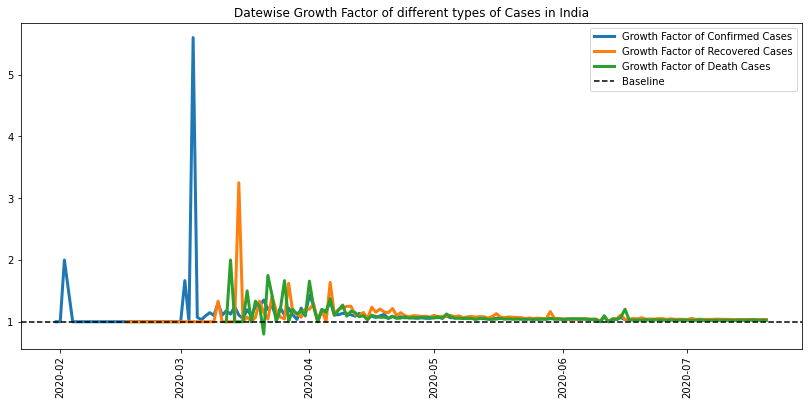

In [39]:
plt.figure(figsize=(14,6))
plt.plot(india_datewise["Confirmed"]/india_datewise["Confirmed"].shift(),linewidth=3,label="Growth Factor of Confirmed Cases")
plt.plot(india_datewise["Recovered"]/india_datewise["Recovered"].shift(),linewidth=3,label="Growth Factor of Recovered Cases")
plt.plot(india_datewise["Deaths"]/india_datewise["Deaths"].shift(),linewidth=3,label="Growth Factor of Death Cases")
plt.axhline(1,linestyle='--',color='black',label="Baseline")
plt.legend()
plt.title("Datewise Growth Factor of different types of Cases in India")
plt.xticks(rotation=90)

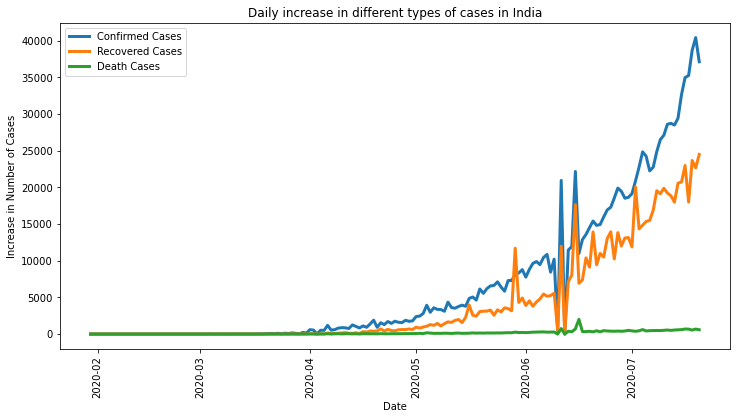

In [40]:
plt.figure(figsize=(12,6))
plt.plot(india_datewise["Confirmed"].diff().fillna(0),linewidth=3,label="Confirmed Cases")
plt.plot(india_datewise["Recovered"].diff().fillna(0),linewidth=3,label="Recovered Cases")
plt.plot(india_datewise["Deaths"].diff().fillna(0),linewidth=3,label="Death Cases")
plt.ylabel("Increase in Number of Cases")
plt.xlabel("Date")
plt.title("Daily increase in different types of cases in India")
plt.xticks(rotation=90)
plt.legend()

#  **The Story of COVID-19 in India**

In [13]:
country_codes = pd.read_csv('/kaggle/input/2014_world_gdp_with_codes.csv/2014_world_gdp_with_codes.csv')
country_codes = country_codes.drop('GDP (BILLIONS)', 1)
country_codes.rename(columns={'COUNTRY': 'Country', 'CODE': 'Code'}, inplace=True)

In [15]:
virus_data = pd.read_csv('/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv')

prev_index = 0
first_time = False
tmp = 0


for i, row in virus_data.iterrows():

    if(virus_data.loc[i,'SNo'] < 1342 and virus_data.loc[i,'Province/State']=='Hubei'):
        if(first_time):
            tmp = virus_data.loc[i,'Confirmed']
            prev_index = i
            virus_data.loc[i,'Confirmed'] = virus_data.loc[i,'Confirmed'] + 593
            first_time = False
        else:
            increment = virus_data.loc[i,'Confirmed'] - tmp
            tmp = virus_data.loc[i,'Confirmed']
            virus_data.loc[i,'Confirmed'] = virus_data.loc[prev_index,'Confirmed'] + increment + 593
            prev_index = i
    

virus_data.rename(columns={'Country/Region': 'Country', 'ObservationDate': 'Date'}, inplace=True)
virus_data = virus_data.fillna('unknow')
virus_data['Country'] = virus_data['Country'].str.replace('US','United States')
virus_data['Country'] = virus_data['Country'].str.replace('UK','United Kingdom') 
virus_data['Country'] = virus_data['Country'].str.replace('Mainland China','China')
virus_data['Country'] = virus_data['Country'].str.replace('South Korea','Korea, South')
virus_data['Country'] = virus_data['Country'].str.replace('North Korea','Korea, North')
virus_data['Country'] = virus_data['Country'].str.replace('Macau','China')
virus_data['Country'] = virus_data['Country'].str.replace('Ivory Coast','Cote d\'Ivoire')
virus_data = pd.merge(virus_data,country_codes,on=['Country'])
#virus_data.head()
#print(len(virus_data))

In [16]:
top_country = virus_data.loc[virus_data['Date'] == virus_data['Date'].iloc[-1]]
top_country = top_country.groupby(['Code','Country'])['Confirmed'].sum().reset_index()
top_country = top_country.sort_values('Confirmed', ascending=False)
top_country = top_country[:30]
top_country_codes = top_country['Country']
top_country_codes = list(top_country_codes)

#countries = virus_data.loc[virus_data['Country'] in top_country_codes]
countries = virus_data[virus_data['Country'].isin(top_country_codes)]
countries_day = countries.groupby(['Date','Code','Country'])['Confirmed','Deaths','Recovered'].sum().reset_index()


exponential_line_x = []
exponential_line_y = []
for i in range(16):
    exponential_line_x.append(i)
    exponential_line_y.append(i)
    
## TOP 30 ##
china = countries_day.loc[countries_day['Code']=='CHN']

new_confirmed_cases_china = []
new_confirmed_cases_china.append( list(china['Confirmed'])[0] - list(china['Deaths'])[0] 
                           - list(china['Recovered'])[0] )

for i in range(1,len(china)):

    new_confirmed_cases_china.append( list(china['Confirmed'])[i] - 
                                     list(china['Deaths'])[i] - 
                                     list(china['Recovered'])[i])
    
    
italy = countries_day.loc[countries_day['Code']=='ITA']

new_confirmed_cases_ita = []
new_confirmed_cases_ita.append( list(italy['Confirmed'])[0] - list(italy['Deaths'])[0] 
                           - list(italy['Recovered'])[0] )

for i in range(1,len(italy)):
    
    new_confirmed_cases_ita.append( list(italy['Confirmed'])[i] - 
                                  list(italy['Deaths'])[i] - 
                                  list(italy['Recovered'])[i])
    
    
india = countries_day.loc[countries_day['Code']=='IND']

new_confirmed_cases_india = []
new_confirmed_cases_india.append( list(india['Confirmed'])[0] - list(india['Deaths'])[0] 
                           - list(india['Recovered'])[0] )

for i in range(1,len(india)):
    
    new_confirmed_cases_india.append( list(india['Confirmed'])[i] - 
                                     list(india['Deaths'])[i] - 
                                    list(india['Recovered'])[i])
    

spain = countries_day.loc[countries_day['Code']=='ESP']

new_confirmed_cases_spain = []
new_confirmed_cases_spain.append( list(spain['Confirmed'])[0] - list(spain['Deaths'])[0] 
                           - list(spain['Recovered'])[0] )

for i in range(1,len(spain)):
    
    new_confirmed_cases_spain.append( list(spain['Confirmed'])[i] - 
                                     list(spain['Deaths'])[i] - 
                                    list(spain['Recovered'])[i])
    

us = countries_day.loc[countries_day['Code']=='USA']

new_confirmed_cases_us = []
new_confirmed_cases_us.append( list(us['Confirmed'])[0] - list(us['Deaths'])[0] 
                           - list(us['Recovered'])[0] )

for i in range(1,len(us)):
    
    new_confirmed_cases_us.append( list(us['Confirmed'])[i] - 
                                     list(us['Deaths'])[i] - 
                                    list(us['Recovered'])[i])
    
    
german = countries_day.loc[countries_day['Code']=='DEU']

new_confirmed_cases_german = []
new_confirmed_cases_german.append( list(german['Confirmed'])[0] - list(german['Deaths'])[0] 
                           - list(german['Recovered'])[0] )

for i in range(1,len(german)):
    
    new_confirmed_cases_german.append( list(german['Confirmed'])[i] - 
                                     list(german['Deaths'])[i] - 
                                    list(german['Recovered'])[i])
    
p1 = figure(plot_width=800, plot_height=550, title="Trajectory of Covid-19")
p1.grid.grid_line_alpha=0.3
p1.ygrid.band_fill_color = "olive"
p1.ygrid.band_fill_alpha = 0.1
p1.xaxis.axis_label = 'Total number of detected cases (Log scale)'
p1.yaxis.axis_label = 'New confirmed cases (Log scale)'

p1.line(exponential_line_x, exponential_line_y, line_dash="4 4", line_width=0.5)

p1.line(np.log(list(china['Confirmed'])), np.log(new_confirmed_cases_china), color='#DBAE23', 
        legend_label='China', line_width=1)
p1.circle(np.log(list(china['Confirmed'])[-1]), np.log(new_confirmed_cases_china[-1]), fill_color="white", size=5)

p1.line(np.log(list(italy['Confirmed'])), np.log(new_confirmed_cases_ita), color='#3EC358', 
        legend_label='Italy', line_width=1)
p1.circle(np.log(list(italy['Confirmed'])[-1]), np.log(new_confirmed_cases_ita[-1]), fill_color="white", size=5)

#p1.line(np.log(list(corea_s['Confirmed'])), np.log(new_confirmed_cases_corea), color='#C3893E', 
#       legend_label='South Korea', line_width=1)
#p1.circle(np.log(list(corea_s['Confirmed'])[-1]), np.log(new_confirmed_cases_corea[-1]), fill_color="white", size=5)


p1.line(np.log(list(india['Confirmed'])), np.log(new_confirmed_cases_india), color='#3E4CC3', 
        legend_label='India', line_width=1)
p1.circle(np.log(list(india['Confirmed'])[-1]), np.log(new_confirmed_cases_india[-1]), fill_color="white", size=5)

p1.line(np.log(list(spain['Confirmed'])), np.log(new_confirmed_cases_spain), color='#F54138', 
        legend_label='Spain', line_width=1)
p1.circle(np.log(list(spain['Confirmed'])[-1]), np.log(new_confirmed_cases_spain[-1]), fill_color="white", size=5)

p1.line(np.log(list(us['Confirmed'])), np.log(new_confirmed_cases_us), color='#23BCDB', 
        legend_label='United States', line_width=1)
p1.circle(np.log(list(us['Confirmed'])[-1]), np.log(new_confirmed_cases_us[-1]), fill_color="white", size=5)

p1.line(np.log(list(german['Confirmed'])), np.log(new_confirmed_cases_german), color='#010A0C', 
        legend_label='Germany', line_width=1)
p1.circle(np.log(list(german['Confirmed'])[-1]), np.log(new_confirmed_cases_german[-1]), fill_color="white", size=5)

p1.legend.location = "bottom_right"

output_file("coronavirus.html", title="coronavirus.py")

show(p1)

In [17]:
countries = virus_data[virus_data['Country'].isin(top_country_codes)]
countries_day = countries.groupby(['Date','Code','Country'])['Confirmed','Deaths','Recovered'].sum().reset_index()


exponential_line_x = []
exponential_line_y = []
for i in range(16):
    exponential_line_x.append(i)
    exponential_line_y.append(i)
       
india = countries_day.loc[countries_day['Code']=='IND']

new_confirmed_cases_india = []
new_confirmed_cases_india.append( list(india['Confirmed'])[0] - list(india['Deaths'])[0] 
                           - list(india['Recovered'])[0] )

for i in range(1,len(india)):
    
    new_confirmed_cases_india.append( list(india['Confirmed'])[i] - 
                                     list(india['Deaths'])[i] - 
                                    list(india['Recovered'])[i])
    
 
p1 = figure(plot_width=800, plot_height=550, title="Trajectory of Covid-19 in India")
p1.grid.grid_line_alpha=0.3
p1.ygrid.band_fill_color = "olive"
p1.ygrid.band_fill_alpha = 0.1
p1.xaxis.axis_label = 'Total number of detected cases (Log scale)'
p1.yaxis.axis_label = 'New confirmed cases (Log scale)'
p = figure(plot_width=400, plot_height=400)
p.outline_line_width = 7
p.outline_line_alpha = 0.3
p.outline_line_color = "navy"

p1.line(exponential_line_x, exponential_line_y, line_dash="4 4", line_width=0.5)

p1.line(np.log(list(india['Confirmed'])), np.log(new_confirmed_cases_india), color='#3E4CC3', 
        legend_label='India', line_width=1)
p1.circle(np.log(list(india['Confirmed'])[-1]), np.log(new_confirmed_cases_india[-1]), fill_color="white", size=5)

p1.legend.location = "bottom_right"

output_file("coronavirus_india.html", title="India.py")

show(p1)

In [41]:
import plotly as py
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=False)

In [43]:
#corona_data=pd.read_csv('/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv')
choro_map=px.choropleth(covid, 
                    locations="Country/Region", 
                    locationmode = "country names",
                    color="Confirmed", 
                    hover_name="Country/Region", 
                    animation_frame="ObservationDate"
                   )

choro_map.update_layout(
    title_text = 'Global Spread of Coronavirus',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
    ))
    
choro_map.show()
